['44,-64,2,0,0,0,0,0,0,0,-4,0,-15,1,-15,1,-14,2,-15,2,-15,1,-15,0,-14,0,-14,0,-13,0,-13,1,-13,2,-13,3,-13,3,-13,2,-13,2,-12,3,-12,3,-12,2,-12,2,-13,2,-13,2,-12,2,-12,2,-12,4,-12,4,-12,4,-6,2,-11,4,-11,4,-11,5,-11,5,-12,4,-13,4,-12,3,-12,3,-11,3,-12,4,-12,4,-12,4,-12,3,-12,3,-12,3,-12,4,-12,4,-12,3,-12,2,-12,1,-12,1,-12,1,-12,1,-12,1,-12,1,-11,0,-3,0,0,0,0,0,0,0,0,0,0,0,-8,-2,-32,-8,-31,-6,-31,-5,-30,-6,-29,-6,-28,-6,-28,-5,-27,-4,-26,-5,-26,-6,-25,-7,-25,-6,-25,-5,-25,-4,-25,-3,-24,-2,-24,-1,-24,-2,-23,-3,-23,-2,-23,0,-23,-1,-23,-2,-23,-2,-23,-2,-23,-2,-24,0,-24,1,-24,2,-23,2,-22,1,-22,0,-22,1,-22,2,-21,1,-23,1,-23,1,-23,0,-23,0,-23,0,-24,0,-24,0,-24,0,-23,-1,-24,-1,-25,-1,-24,-1,-23,-2,-24,-3,-24,-3,-23,-4,-23,-4,-22,-5,-21,-5,-22,-6,-21,-7,-21,-8,-6,-2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-4,-9,-15,-35,-13,-36,-13,-35,-13,-35,-10,-37,-7,-38,-4,-38,-3,-38,-3,-37,-3,-38,-3,-38,-3,-36,-3,-36,-1,-37,2,-37,2,-36,0,-35,1,-36,4,-36,5,-36,5,-36,5,-35,4,-35,3,-36,2,-35,4,-34,5,-33,5,-34,4,-34,

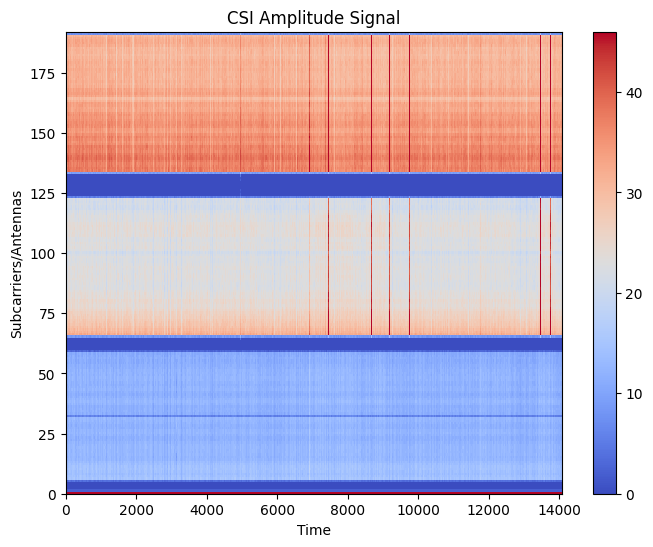

In [2]:
import numpy as np 
import matplotlib.pyplot as plt
import re

amplitudes = []

for line in open('absence2.dat', 'r'):
    if len(line) < 2:
        continue

    csi_values = re.findall(r'\[(.*?)\]', line)
    print(csi_values)
    if len(csi_values) > 0:
        values = csi_values[0].split(',')
        amplitude_values = [int(val) for val in values if val.replace('-', '').isdigit()]
        amplitude = [np.sqrt(amplitude_values[i] ** 2 + amplitude_values[i + 1] ** 2) for i in range(0, len(amplitude_values), 2)]
        amplitudes.append(amplitude)

amplitudes = np.array(amplitudes)

plt.figure(figsize=(8, 6))
plt.pcolor(amplitudes.T, cmap='coolwarm', vmin=0, vmax=46)
plt.colorbar()
plt.title('CSI Amplitude Signal')
plt.xlabel('Time')
plt.ylabel('Subcarriers/Antennas')
plt.show()

In [3]:
import pandas as pd

data = []
for row in amplitudes:

    flat_amplitudes = row.flatten()
    
    row_data = \
    {
        'label': 0,
        'amplitudes': flat_amplitudes
    }

    data.append(row_data)

df = pd.DataFrame(data)
df.head()

,label,amplitudes
0,0,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 4.0, 15..."
1,0,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 3.60555..."
2,0,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 3.16227..."
3,0,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 3.60555..."
4,0,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 4.47213..."


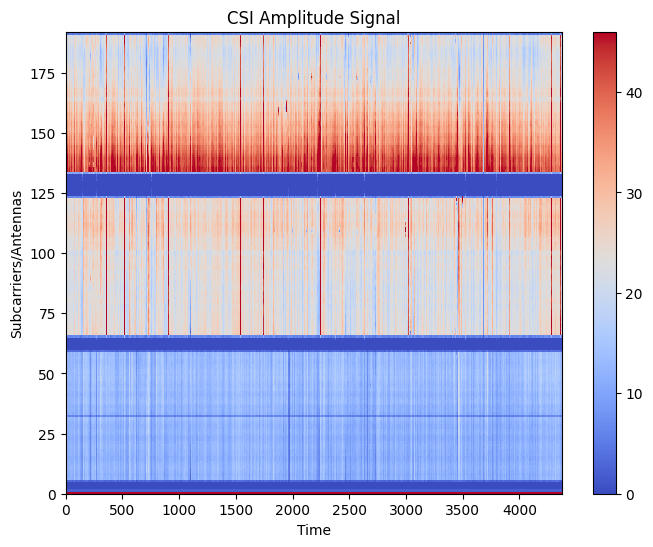

In [4]:
import numpy as np 
import matplotlib.pyplot as plt
import re

amplitudes = []

for line in open('detected.dat', 'r'):
    if len(line) < 2:
        continue

    csi_values = re.findall(r'\[(.*?)\]', line)
        
    if len(csi_values) > 0:
        values = csi_values[0].split(',')
        amplitude_values = [int(val) for val in values if val.replace('-', '').isdigit()]
        amplitude = [np.sqrt(amplitude_values[i] ** 2 + amplitude_values[i + 1] ** 2) for i in range(0, len(amplitude_values), 2)]
        amplitudes.append(amplitude)

amplitudes = np.array(amplitudes)

plt.figure(figsize=(8, 6))
plt.pcolor(amplitudes.T, cmap='coolwarm', vmin=0, vmax=46)
plt.colorbar()
plt.title('CSI Amplitude Signal')
plt.xlabel('Time')
plt.ylabel('Subcarriers/Antennas')
plt.show()

In [5]:
data = []
for row in amplitudes:

    flat_amplitudes = row.flatten()
    
    row_data = \
    {
        'label': 1,
        'amplitudes': flat_amplitudes
    }

    data.append(row_data)

df2 = pd.DataFrame(data)
df2.head()

,label,amplitudes
0,1,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 3.0, 11..."
1,1,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 2.82842..."
2,1,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 4.24264..."
3,1,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 3.60555..."
4,1,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 2.0, 11..."


In [6]:
combined_df = pd.concat([df, df2], ignore_index=True)
combined_df

,label,amplitudes
0,0,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 4.0, 15..."
1,0,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 3.60555..."
2,0,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 3.16227..."
3,0,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 3.60555..."
4,0,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 4.47213..."
...,...,...
18435,1,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 3.60555..."
18436,1,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 3.0, 13..."
18437,1,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 2.82842..."
18438,1,"[77.6659513557904, 2.0, 0.0, 0.0, 0.0, 2.23606..."


In [8]:
from sklearn.model_selection import train_test_split

X = pd.DataFrame(combined_df['amplitudes'].tolist())
y = combined_df['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

c:\Users\panha\anaconda3\envs\tf\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


X_train shape: (14752, 192)
X_test shape: (3688, 192)
y_train shape: (14752,)
y_test shape: (3688,)


In [43]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

pca = PCA(n_components=12)

X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

columns_pca = [f'PC{i+1}' for i in range(12)]
X_train_pca_df = pd.DataFrame(data=X_train_pca, columns=columns_pca)
X_test_pca_df = pd.DataFrame(data=X_test_pca, columns=columns_pca)

print("X_train PCA:")
print(X_train_pca_df.head())

print("\nX_test PCA:")
print(X_test_pca_df.head())

X_train PCA:
        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -5.591325  9.078181 -2.930537 -0.079099 -0.510397  0.534287  2.270518   
1  0.939166  5.317151 -5.834877  2.375958 -3.461370  0.793093  0.547610   
2  4.455555 -0.257932  3.839470  1.110916 -0.612555 -0.000219  1.362750   
3 -0.877472 -3.374630  2.153446 -0.807675  0.645348  0.310437 -1.013264   
4 -0.317404 -6.343134 -0.828293  0.015360 -0.570234 -0.854749 -0.999508   

        PC8       PC9      PC10      PC11      PC12  
0  0.241080 -0.010375 -0.948413 -0.191203  0.221638  
1  0.021110  1.121760  0.180657  0.670425  0.150185  
2  0.029838 -0.016995 -0.501292  0.490867 -0.125308  
3  0.042560  0.162791  0.599564 -0.303332  0.144474  
4 -0.075103  1.027777  0.092388  0.038560  0.092033  

X_test PCA:
         PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0  -7.166108  7.978998 -4.247278 -2.363736  1.465408 -1.531360  0.492816   
1   4.565252 -1.722260  3.323586  1.558536 -1.2

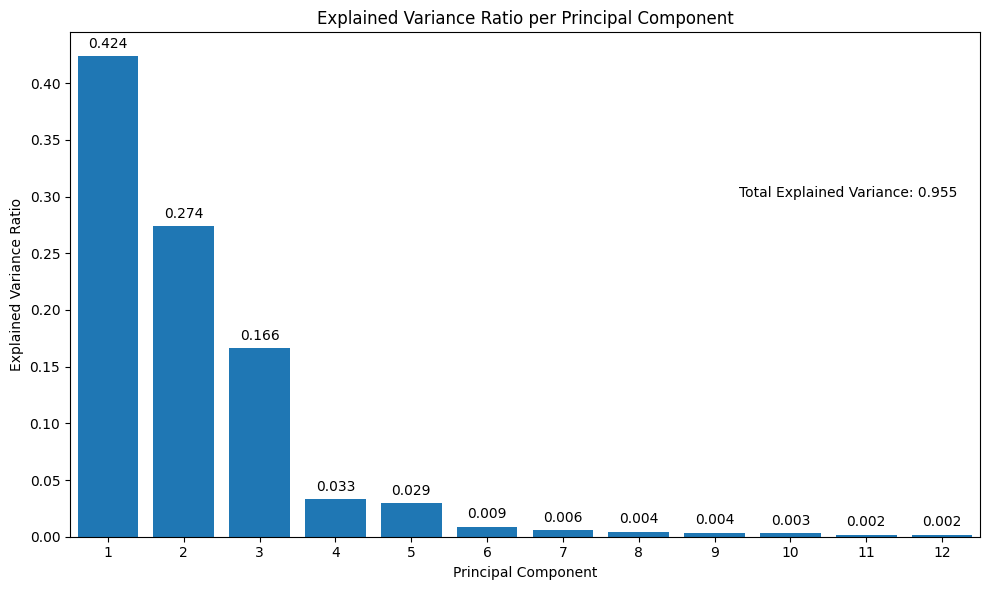

In [44]:
sorted_variance_ratio = sorted(pca.explained_variance_ratio_, reverse=True)
plt.figure(figsize=(10, 6))

plt.bar(range(1, len(sorted_variance_ratio) + 1), sorted_variance_ratio)

plt.xlim(0.5, len(sorted_variance_ratio) + 0.5)
plt.xticks(range(1, len(sorted_variance_ratio) + 1))

plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio per Principal Component')

for i, ratio in enumerate(sorted_variance_ratio):
    plt.text(i + 1, ratio + 0.005, f'{ratio:.3f}', ha='center', va='bottom')

total_variance_ratio = sum(sorted_variance_ratio)

text_box = f'Total Explained Variance: {total_variance_ratio:.3f}'
plt.text(len(sorted_variance_ratio) + 0.2, 0.30, text_box, ha='right')

plt.tight_layout()
plt.show()

## Model_1 : Decision Tree

0.9967462039045553


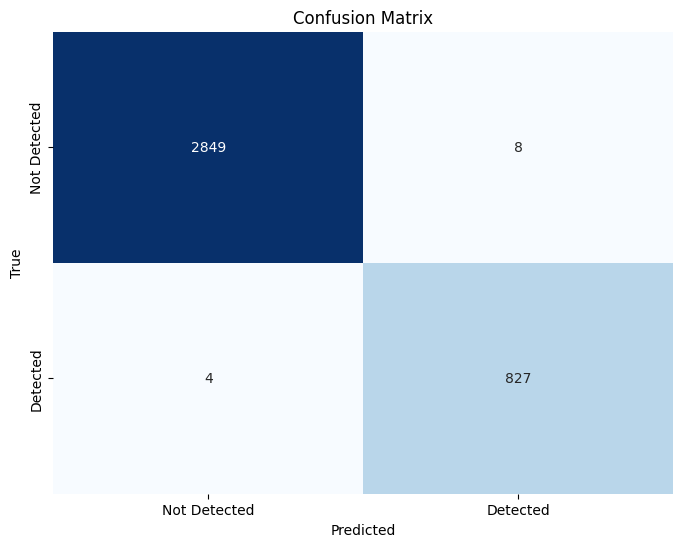

In [45]:
from sklearn import tree
from sklearn.metrics import accuracy_score, confusion_matrix
import seaborn as sns

model_1 = tree.DecisionTreeClassifier()
model_1.fit(X_train_pca_df, y_train)

pred = model_1.predict(X_test_pca_df)
print(accuracy_score(y_test, pred))

conf_matrix = confusion_matrix(y_test, pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Not Detected', 'Detected'], yticklabels=['Not Detected', 'Detected'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## Model_2 : Random Forest

In [46]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

rf_classifier = RandomForestClassifier(random_state=42)

param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(rf_classifier, param_grid, cv=5, scoring='accuracy')

grid_search.fit(X_train_pca_df, y_train)

best_params = grid_search.best_params_
print("Best Parameters:", best_params)

Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


Accuracy: 0.9981019522776573


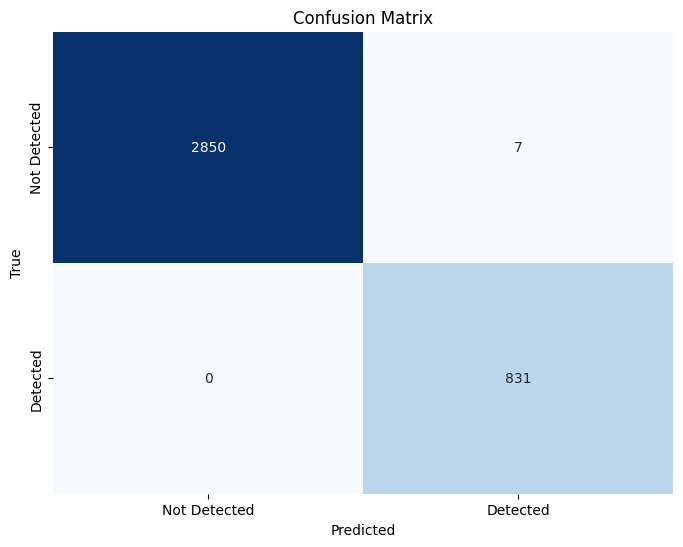

In [47]:
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt

best_params = {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}

model_2 = RandomForestClassifier(**best_params, random_state=42)

model_2.fit(X_train_pca_df, y_train)

y_pred = model_2.predict(X_test_pca_df)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

conf_matrix = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Not Detected', 'Detected'], yticklabels=['Not Detected', 'Detected'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## Model_3: LSTM

In [48]:
# from keras.models import Sequential
# from keras.layers import LSTM, Dense, Dropout
# from keras.wrappers.scikit_learn import KerasClassifier
# from sklearn.model_selection import GridSearchCV
# from sklearn.preprocessing import MinMaxScaler
# from sklearn.pipeline import Pipeline

# def create_lstm_model(units=50, optimizer='adam', dropout_rate=0.1):
#     model = Sequential()
#     model.add(LSTM(units=units, return_sequences=True, input_shape=(X_train_pca.shape[1], 1)))
#     model.add(Dropout(dropout_rate))
#     model.add(LSTM(units=64))
#     model.add(Dropout(dropout_rate))
#     model.add(Dense(1))
#     model.compile(loss="mse", optimizer=optimizer, metrics=['accuracy'])
#     return model

# pipeline = Pipeline([
#     ('scaler', MinMaxScaler()),
#     ('lstm', KerasClassifier(build_fn=create_lstm_model, verbose=1))
# ])

# param_grid = {
#     'lstm__units': [32, 50, 64 , 100, 128],
#     'lstm__optimizer': ['adam', 'rmsprop'],
#     'lstm__epochs': [10, 20, 30],
#     'lstm__batch_size': [32, 64]
# }

# grid_search = GridSearchCV(pipeline, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error')
# grid_search.fit(X_train_pca_df, y_train)

# best_params = grid_search.best_params_
# print("Best Hyperparameters:", best_params)

#### Best Hyperparameters: {'lstm__batch_size': 32, 'lstm__epochs': 30, 'lstm__optimizer': 'adam', 'lstm__units': 100}

Epoch 1/30
461/461 [==============================] - 6s 8ms/step - loss: 0.0791 - accuracy: 0.9755 - val_loss: 0.0456 - val_accuracy: 0.9848
Epoch 2/30
461/461 [==============================] - 2s 5ms/step - loss: 0.0228 - accuracy: 0.9939 - val_loss: 0.0201 - val_accuracy: 0.9940
Epoch 3/30
461/461 [==============================] - 2s 5ms/step - loss: 0.0118 - accuracy: 0.9965 - val_loss: 0.0243 - val_accuracy: 0.9913
Epoch 4/30
461/461 [==============================] - 2s 5ms/step - loss: 0.0093 - accuracy: 0.9970 - val_loss: 0.0102 - val_accuracy: 0.9959
Epoch 5/30
461/461 [==============================] - 2s 5ms/step - loss: 0.0046 - accuracy: 0.9982 - val_loss: 0.0127 - val_accuracy: 0.9962
Epoch 6/30
461/461 [==============================] - 2s 5ms/step - loss: 0.0066 - accuracy: 0.9984 - val_loss: 0.0075 - val_accuracy: 0.9970
Epoch 7/30
461/461 [==============================] - 2s 5ms/step - loss: 0.0031 - accuracy: 0.9990 - val_loss: 0.0101 - val_accuracy: 0.9965
Epoch 

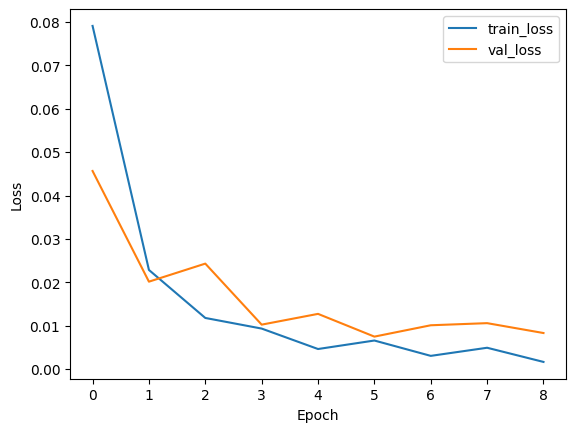

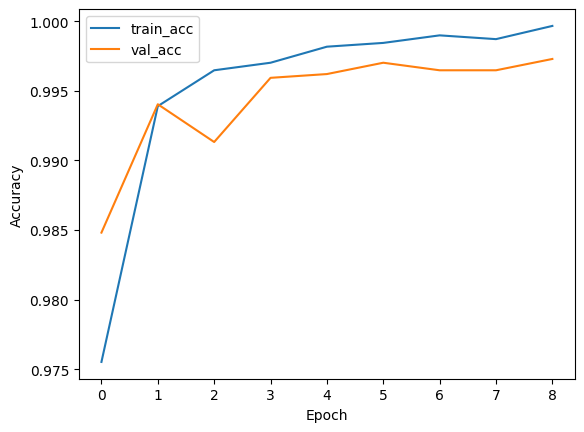

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2857
           1       0.99      0.99      0.99       831

    accuracy                           1.00      3688
   macro avg       1.00      1.00      1.00      3688
weighted avg       1.00      1.00      1.00      3688



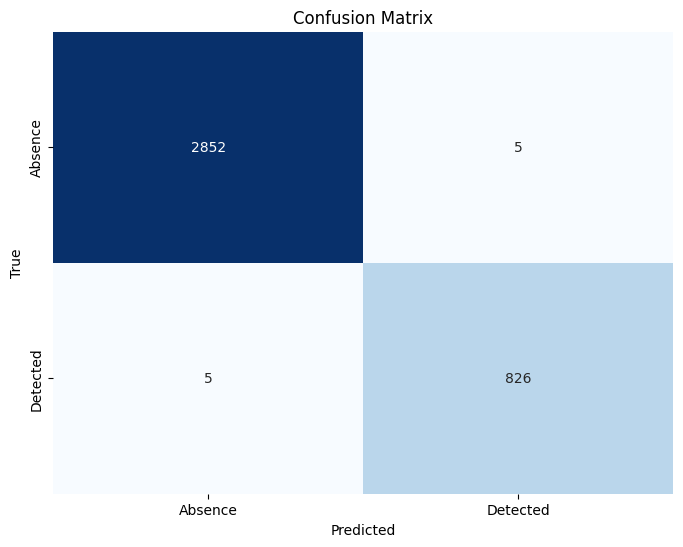

In [49]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

lstm_units = 100
optimizer = "adam"

def create_lstm_model():
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=(X_train_pca_df.shape[1], 1)))
    model.add(Dropout(0.1))
    model.add(LSTM(units=64))
    model.add(Dropout(0.1))
    model.add(Dense(1, activation="sigmoid"))
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

early_stopping = EarlyStopping(monitor="val_loss", patience=3)
model_checkpoint = ModelCheckpoint(filepath="LSTM_model.hdf5", monitor="val_loss", save_best_only=True)

model = create_lstm_model()

history = model.fit(X_train_pca_df, y_train, epochs=30, batch_size=32, validation_data=(X_test_pca_df, y_test), callbacks=[early_stopping, model_checkpoint])

y_pred_prob = model.predict(X_test_pca_df)
y_pred = (y_pred_prob > 0.5).astype(int)

plt.plot(history.history["loss"], label="train_loss")
plt.plot(history.history["val_loss"], label="val_loss")
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()

plt.plot(history.history["accuracy"], label="train_acc")
plt.plot(history.history["val_accuracy"], label="val_acc")
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.show()

print(classification_report(y_test, y_pred))
conf_matrix = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Absence', 'Detected'], yticklabels=['Absence', 'Detected'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()